# Laboratorium 2

Przygotuj program generujący następujące zbiory punktów na płaszczyźnie (współrzędne rzeczywiste typu double):

    a) 100 losowo wygenerowanych punktów o współrzędnych z przedziału [-100, 100],

    b) 100 losowo wygenerowanych punktów leżących na okręgu o środku (0,0) i promieniu R=10,

    c) 100 losowo wygenerowanych punktów leżących na bokach prostokąta o wierzchołkach (-10, 10), (-10,-10), (10,-10), (10,10),

    d) wierzchołki kwadratu (0, 0), (10, 0), (10, 10), (0, 10) oraz punkty wygenerowane losowo w sposób następujący: po 25 punktów na dwóch bokach kwadratu leżących na osiach i po 20 punktów na przekątnych kwadratu.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import timeit
import random
from functools import partial
from functools import cmp_to_key
import json as js
%matplotlib inline
sns.set_style('darkgrid')
def scatter_plot(data, otoczka, name, end = False):
    if name == "graham":
        points = data
        x, y = zip(*points)
    else:
        x, y = data['X'], data['Y']
    plt.scatter(x, y, c='green')
    if len(otoczka) != 0:
        for i in range(len(otoczka)):
            if i == len(otoczka) - 1:
                if end:
                    i = -1
                else:
                    break
            x1, y1 = otoczka[i]
            x2, y2 = otoczka[i + 1]
            plt.plot((x1, x2), (y1, y2), linestyle='-', color='red')
            plt.scatter((x1, x2), (y1, y2), c='red')
    plt.show()

## Rozwiązanie

#### a) 100 losowo wygenerowanych punktów o współrzędnych z przedziału [-100, 100]

In [2]:
tab_a = np.random.uniform(-100, 100, size =[100, 2])
data_a = pd.DataFrame(data=tab_a, columns=['X', 'Y'])

In [3]:
data_a.head()

,X,Y
0,70.592423,26.838248
1,23.279086,-11.763070
2,-56.410022,64.553248
3,94.072933,-91.869119
4,-94.902405,-26.333176


#### b) 100 losowo wygenerowanych punktów leżących na okręgu o środku (0,0) i promieniu R=10

In [4]:
tab_b = [None for _ in range(100)]
for i in range(100):
    alpha = 2 * np.pi * np.random.uniform(0, 1)
    tab_b[i] = (10 * np.cos(alpha), 10 * np.sin(alpha))
data_b = pd.DataFrame(data=tab_b, columns=['X', 'Y'])

In [5]:
data_b.head()

,X,Y
0,-8.901340,-4.556989
1,-9.994568,-0.329565
2,-5.416031,-8.406343
3,-6.390499,-7.691653
4,0.575527,-9.983425


#### c) 100 losowo wygenerowanych punktów leżących na bokach prostokąta o wierzchołkach (-10, 10), (-10,-10), (10,-10), (10,10)

In [6]:
a = (-10, 10)
b = (-10, -10)
c = (10, -10)
d = (10, 10)
tab_c = [a,b,c,d]
for i in range(100):
    point = np.random.uniform(0, 80)
    if point <= 20:
        tab_c.append((-10,point-10))
    if 20 < point <= 40:
        tab_c.append((10,point-30))
    if 40 < point <= 60:
        tab_c.append((point-50,10))
    if 60 < point :
        tab_c.append((point-70,-10))
data_c = pd.DataFrame(data=tab_c, columns=['X', 'Y'])

In [7]:
data_c.head()

,X,Y
0,-10.00000,10.0
1,-10.00000,-10.0
2,10.00000,-10.0
3,10.00000,10.0
4,-5.12329,-10.0


#### d) wierzchołki kwadratu (0, 0), (10, 0), (10, 10), (0, 10) oraz punkty wygenerowane losowo w sposób następujący: po 25 punktów na dwóch bokach kwadratu leżących na osiach i po 20 punktów na przekątnych kwadratu

In [8]:
a = (0, 0)
b = (10, 0)
c = (10, 10)
d = (0, 10)
tab_d = [a,b,c,d]
for i in range(2):
    for j in range(25):
        point = np.random.uniform(0, 10)
        if i == 0:
            tab_d.append((0,point))
        else:
            tab_d.append((point,0))
        
for i in range(2):
    for j in range(20):
        point = np.random.uniform(0, 10)
        if i == 0:
            tab_d.append((point,point))
        else:
            tab_d.append((point,10-point))
data_d = pd.DataFrame(data=tab_d, columns=['X', 'Y'])

In [9]:
data_d.head()

,X,Y
0,0.0,0.00000
1,10.0,0.00000
2,10.0,10.00000
3,0.0,10.00000
4,0.0,9.05497


## Wizualizacja

#### Zbiór a)

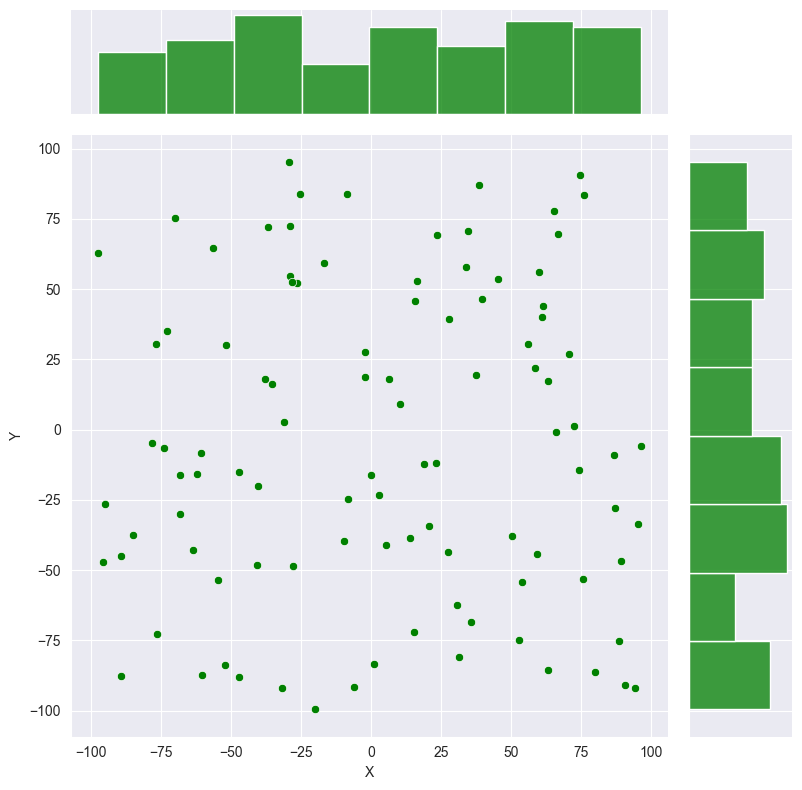

In [55]:
sns.jointplot(data=data_a, x='X', y='Y', kind='scatter', height=8, color='green')

#### Zbiór b)

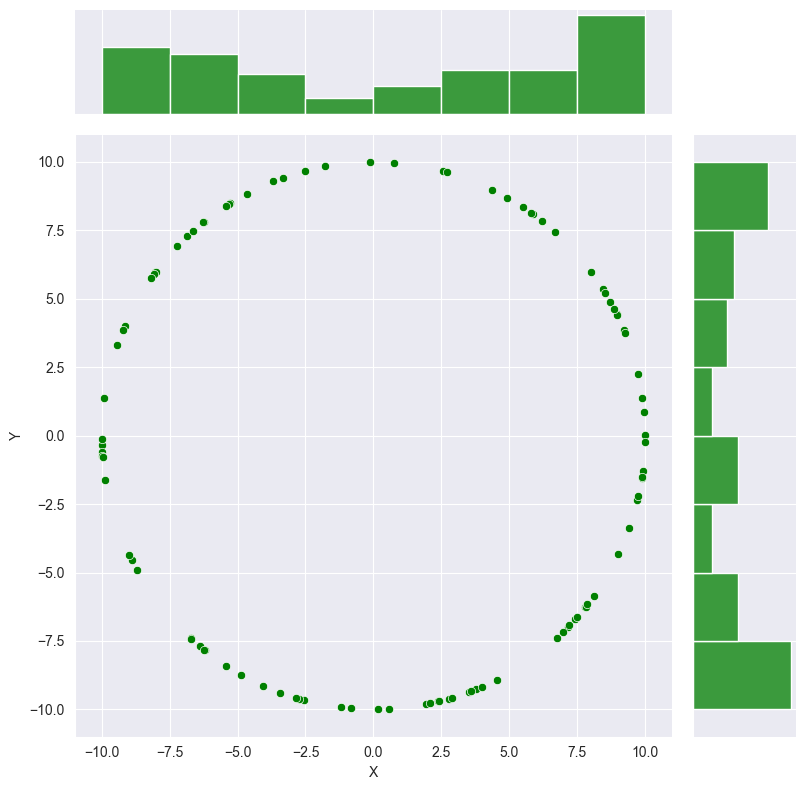

In [56]:
sns.jointplot(data=data_b, x='X', y='Y', kind='scatter', height=8, color='green')

#### Zbiór c)

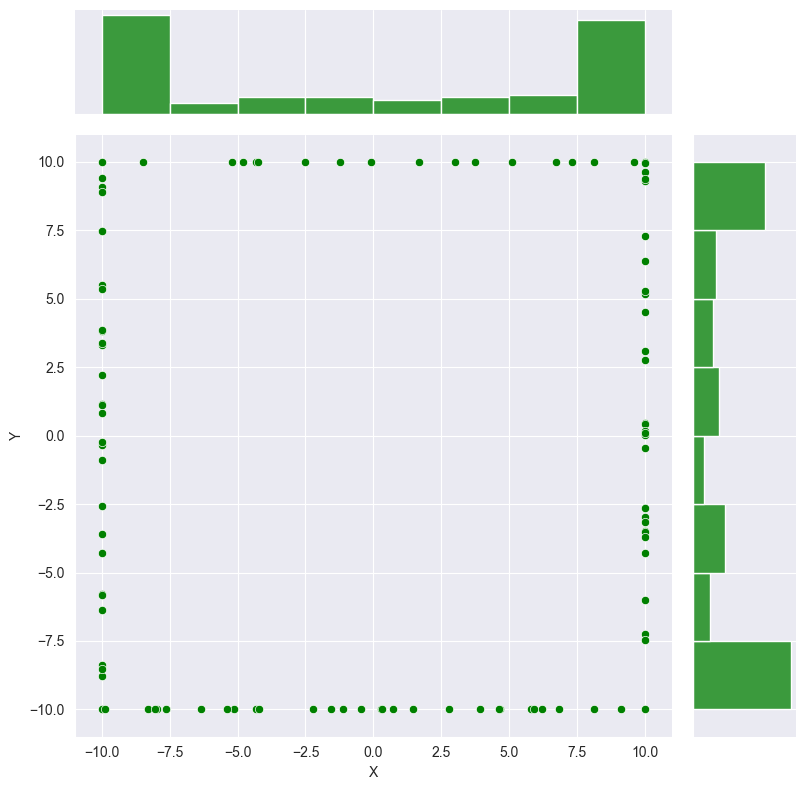

In [57]:
sns.jointplot(data=data_c, x='X', y='Y', kind='scatter', height=8, color='green')

#### Zbiór d)

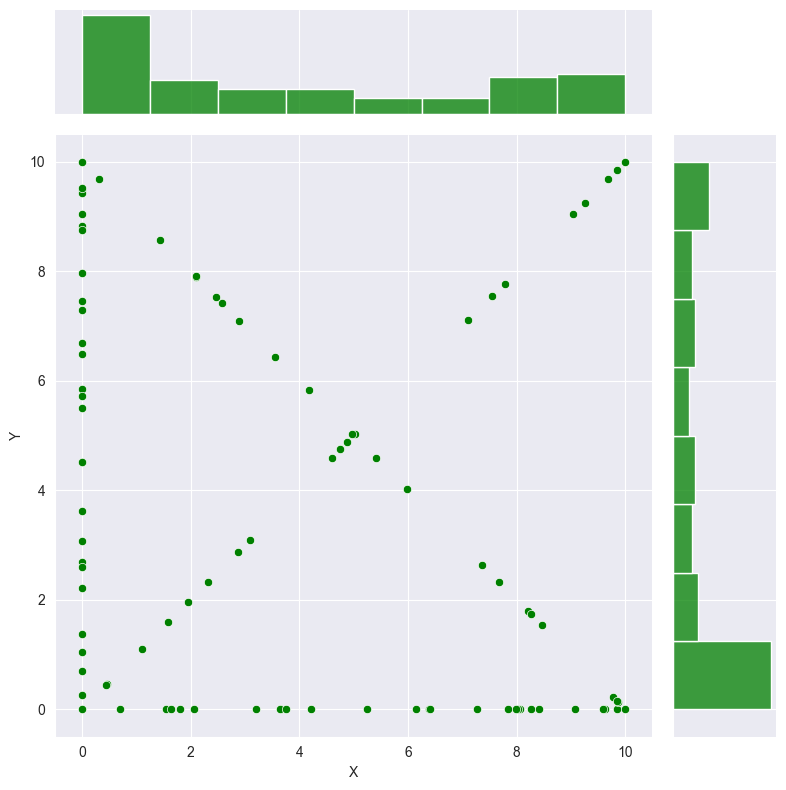

In [58]:
sns.jointplot(data=data_d, x='X', y='Y', kind='scatter', height=8, color='green')

## Zmodyfikuj program z punktu 1 tak, aby możliwe było zadawanie określonych parametrów dla schematów losowania punktów podanych powyżej:
    a) liczba punktów, przedziały dla współrzędnych,
    b) liczba punktów, środek i promień okręgu,
    c) liczba punktów, wierzchołki prostokąta,
    d) wierzchołki kwadratu, liczba punktów na osiach, liczba punktów na przekątnych.

#### Zbiór a)

In [14]:
def generate_random_points(count,ranges):
    table = np.random.uniform(ranges[0], ranges[1], size =[count, 2])
    return table

In [15]:
new_tab_a = generate_random_points(50,[-50,50])
new_data_a = pd.DataFrame(data=new_tab_a, columns=['X', 'Y'])

In [16]:
new_data_a.head()

,X,Y
0,-18.749967,-30.451134
1,26.007831,38.149879
2,-49.500304,-14.179288
3,9.400284,-43.486611
4,-41.705085,-7.448895


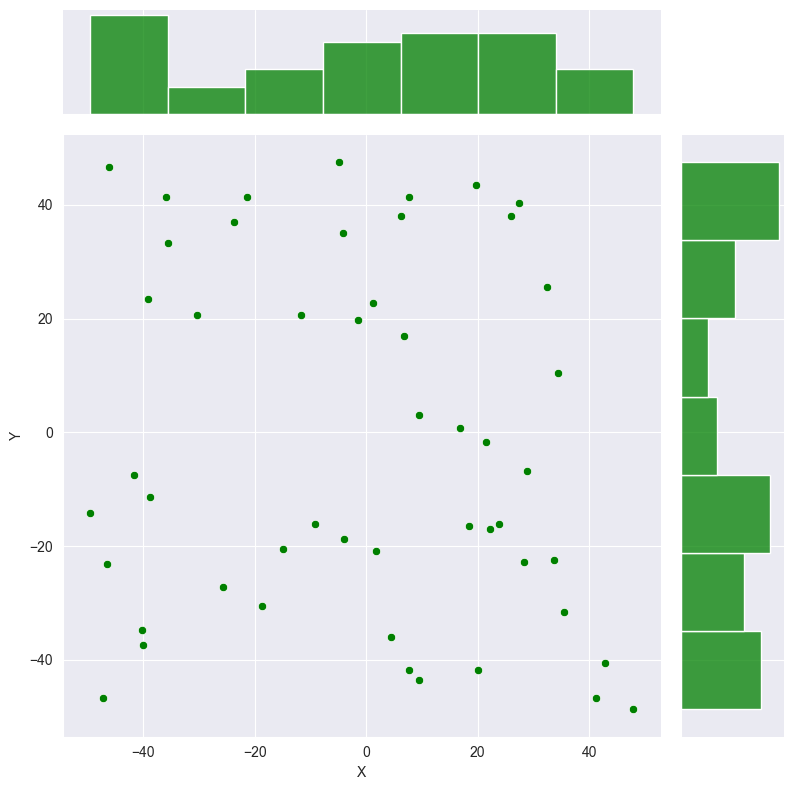

In [59]:
sns.jointplot(data=new_data_a, x='X', y='Y', kind='scatter', height=8, color='green')

#### Zbiór b)

In [18]:
def generate_random_circle(count,center,R):
    table = [None for _ in range(count)]
    for i in range(count):
        alpha = 2 * np.pi * np.random.uniform(0, 1)
        table[i] = (R * np.cos(alpha)+ center[0], R * np.sin(alpha) + center[1])
    return table

In [19]:
new_tab_b = generate_random_circle(70,(30,30),20)
new_data_b = pd.DataFrame(data=new_tab_b, columns=['X', 'Y'])

In [20]:
new_data_b.head()

,X,Y
0,49.540533,25.737657
1,25.079447,49.385256
2,13.708034,41.600510
3,26.653166,10.282021
4,43.842829,44.435238


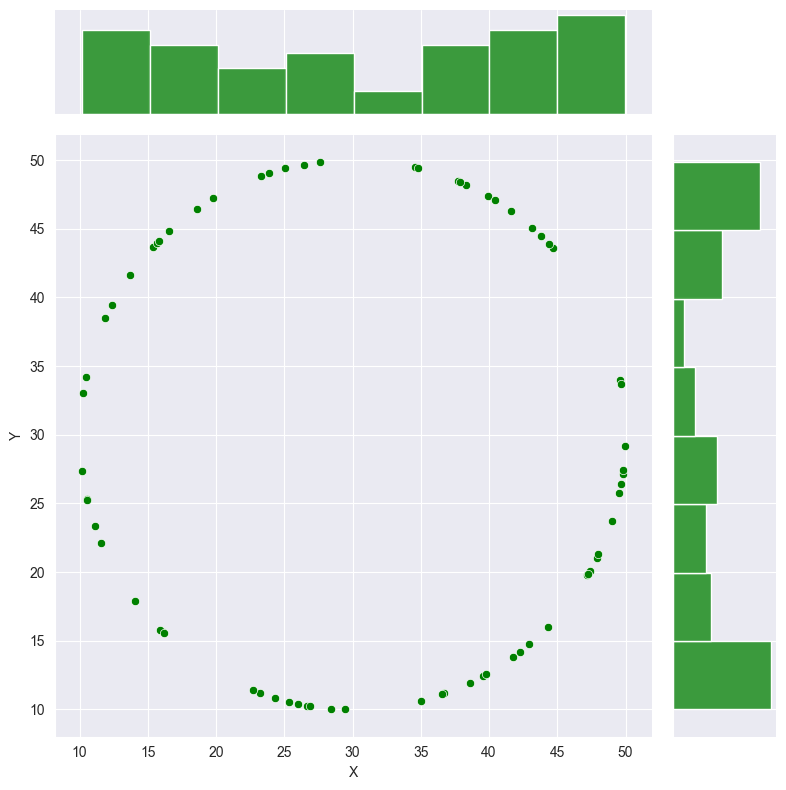

In [60]:
sns.jointplot(data=new_data_b, x='X', y='Y', kind='scatter', height=8, color='green')

#### Zbiór c)

In [22]:
def generate_random_rectangle(count,vertices):
    min_x = min_y = float('inf')
    max_x = max_y = -float('inf')
    for v in vertices:
        min_x = min(min_x, v[0])
        max_x = max(max_x, v[0])
        min_y = min(min_y, v[1])
        max_y = max(max_y, v[1])
    x_side = abs(max_x - min_x)
    y_side = abs(max_y - min_y)
    total = 2*x_side + 2*y_side
    table = []
    for v in vertices:
        table.append(v)
    for i in range(count):
        point = np.random.uniform(0, total)
        if point <= y_side:
            table.append((min_x,min_y + point))
        elif y_side < point <= 2 * y_side:
            table.append((max_x,min_y + (point-y_side)))
        elif 2 * y_side < point <= 2 * y_side + x_side:
            table.append((min_x + (point-2 * y_side),min_y))
        else:
            table.append((min_x + (point-(2 * y_side + x_side)),max_y))
    return table

In [23]:
new_tab_c = generate_random_rectangle(50,[(-20, -10), (-20, 30), (30, 30), (30, -10)])
new_data_c = pd.DataFrame(data=new_tab_c, columns=['X', 'Y'])

In [24]:
new_data_c.head()

,X,Y
0,-20.000000,-10.0
1,-20.000000,30.0
2,30.000000,30.0
3,30.000000,-10.0
4,-3.984227,-10.0


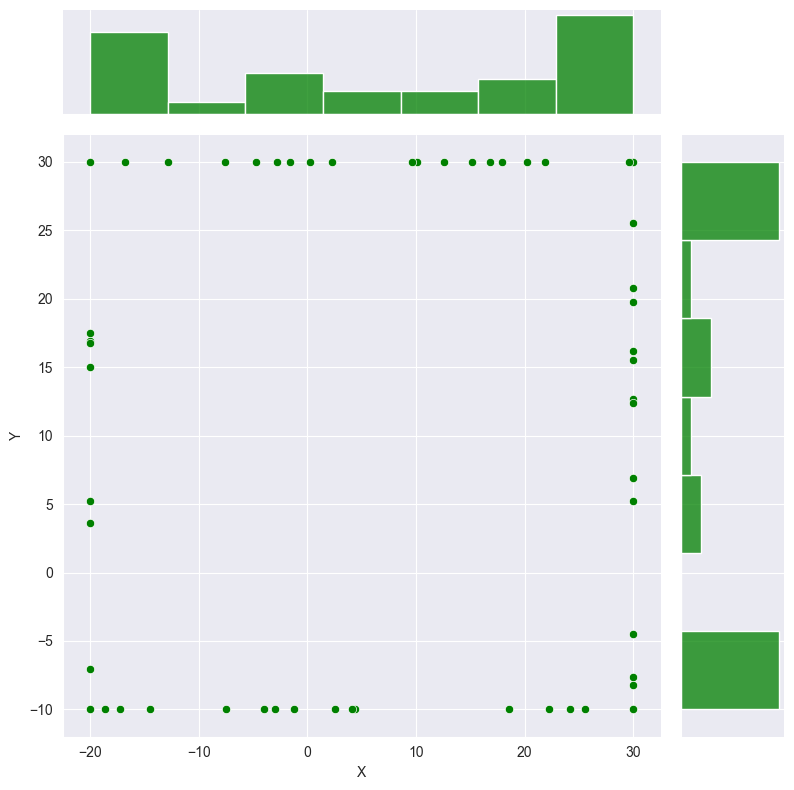

In [61]:
sns.jointplot(data=new_data_c, x='X', y='Y', kind='scatter', height=8, color='green')

#### Zbiór d)

In [125]:
def generate_random_square(vertices,side_inner,diagonal):
    min_x = min_y = float('inf')
    max_x = max_y = -float('inf')
    for v in vertices:
        min_x = min(min_x, v[0])
        max_x = max(max_x, v[0])
        min_y = min(min_y, v[1])
        max_y = max(max_y, v[1])
    side = abs(max_x - min_x)
    table = []
    for v in vertices:
        table.append(v)
    for i in range(2):
        for j in range(side_inner):
            point = np.random.uniform(0, side)
            if i == 0:
                table.append((min_x,min_y + point))
            else:
                table.append((min_x + point,min_y))
        
    for i in range(2):
        for j in range(diagonal):
            point = np.random.uniform(0, side)
            if i == 0:
                table.append((min_x + point,min_y + point))
            else:
                table.append((min_x + point,max_y - point))
    return table

In [27]:
new_tab_d = generate_random_square([(-10, -10), (-10, 10), (10, -10), (10, 10)],50,40)
new_data_d = pd.DataFrame(data=new_tab_d, columns=['X', 'Y'])

In [28]:
new_data_d.head()

,X,Y
0,-10.0,-10.000000
1,-10.0,10.000000
2,10.0,-10.000000
3,10.0,10.000000
4,-10.0,6.825744


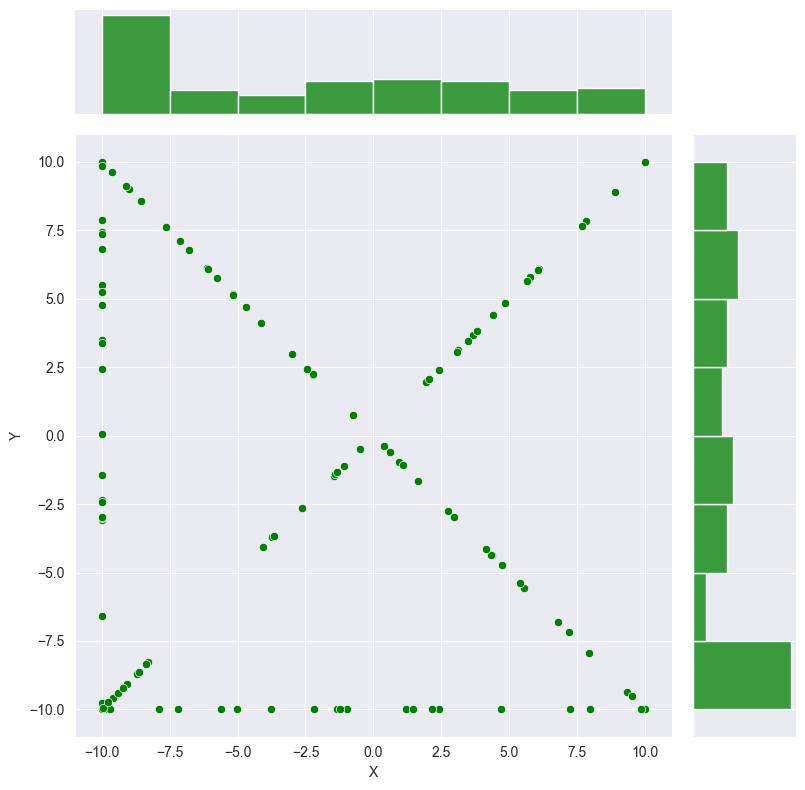

In [62]:
sns.jointplot(data=new_data_d, x='X', y='Y', kind='scatter', height=8, color='green')

## Zaimplementuj algorytmy Grahama oraz Jarvisa wyznaczające otoczkę wypukłą dla zadanego zbioru punktów. Przetestuj program na zbiorach z punktu 1 oraz zmodyfikowanych zbiorach z punktu 3. Program powinien pozwolić na zapisanie w pliku wyniku działania, czyli ciągu wierzchołków otoczki. Dodaj możliwość sprawdzenia czasu działania algorytmu

In [173]:
def distance(p1, p2):
    return np.sqrt((p1[0] - p2[0]) ** 2 + (p1[1] - p2[1]) ** 2)
epsilon=10 ** (-12)
def lower_left(data):
    index = 0
    point = [float('inf'),float('inf')]
    for i,p in data.iterrows():
        if(p['Y'] < point[1]):
            point[0] = p['X']
            point[1] = p['Y']
            index = i
        elif p['Y'] == point[1] and p['X'] < point[0]:
            point[0] = p['X']
            point[1] = p['Y']
            index = i
    return (point[0],point[1]),index
def compare(a, b, c,del_tab, epsilon):
    orientation = det(c, a, b)
    if -epsilon <= orientation <= epsilon:
        
        if(distance(a, c) < distance(b, c)):
#             if(a not in del_tab):
#                 del_tab.append(a)
            return -1
           
        else:
#             if(b not in del_tab):
#                 del_tab.append(b)
            return 1
           
    else:
        if orientation > epsilon:
            return -1
        else:
            return 1
def det(a, b, c):
    first = (a[0] - c[0]) * (b[1] - c[1])
    second = (a[1] - c[1]) * (b[0] - c[0])
    return first - second

### Algorytm Grahama

In [169]:
def graham(data,epsilon=10 ** (-12),write = False,visualize=True):
    point,index = lower_left(data)
    punkty = []
    for i,p in data.iterrows():
        punkty.append((p['X'], p['Y']))
    del_tab = []
    points_to = sorted(punkty,key=cmp_to_key(lambda x,y: compare(x,y,c=point,del_tab = del_tab,epsilon=epsilon)))
    otoczka = [point,points_to[0]]
    for point in points_to[1:]:
        orientation = det(otoczka[-2], otoczka[-1], point)
        while orientation < -epsilon:
            otoczka.pop()
            orientation = det(otoczka[-2], otoczka[-1], point)
        if -epsilon <= orientation <= epsilon:
            otoczka.pop()
        otoczka.append(point)
        if visualize:
            scatter_plot(punkty, otoczka, "graham")
    if visualize:
        scatter_plot(punkty, otoczka, "graham", end=True)
    if write:
        with open('graham.txt', 'w') as file:
            for pnt in otoczka:
                file.write(str(pnt)+"\n")
    return otoczka



### Algorytm Jarvisa

In [314]:
def jarvis(data, epsilon=10 ** (-12),write = False, visualize=True):
    point, index = lower_left(data)
    otoczka = [point]
    p = index
    dl = len(data)
    while True:
        q = (p + 1) % dl
        for i, r in data.iterrows():
            
            p1 = (data['X'][p], data['Y'][p])
            p2 = (data['X'][q], data['Y'][q])
            p3 = (r[0], r[1])
            orientation = det(p1, p2, p3)
#             if -epsilon <= orientation <= epsilon:
#                 if distance(p1, p2) < distance(p1, p3):
#                     q = i
            if orientation < -epsilon:
                q = i
        p = q
        otoczka.append((data['X'][p], data['Y'][p]))
        if visualize:
            scatter_plot(data, otoczka, "jarvis")
        if p == index:
            break
    otoczka.pop()
    if write:
        with open('jarvis.txt', 'w') as file:
            for pnt in otoczka:
                file.write(str(pnt)+"\n")
    return otoczka

# SZYBSZY JARVIS DODATKOWO ZAIMPLEMENTOWANT :::
class Point:
    def __init__(self, x, y):
        self.x = x
        self.y = y
 
def Left_index(points):
    minn = 0
    for i in range(1,len(points)):
        if points[i][1] < points[minn][1]:
            minn = i
        elif points[i][1] == points[minn][1]:
            if points[i][0] < points[minn][0]:
                minn = i
    return minn
def det(a, b, c):
    first = (a[0] - c[0]) * (b[1] - c[1])
    second = (a[1] - c[1]) * (b[0] - c[0])
    return first - second
def orientation(p, q, r):
    val = (q[1] - p[1]) * (r[0] - q[0]) - (q[0] - p[0]) * (r[1] - q[1])
    epsilon = 10**-12
    if -epsilon <= val <= epsilon:
        if distance(p, r) < distance(p, q):
            return 2
        return 0
    elif val > epsilon:
        return 1
    else:
        return 2
 
def convexHull(points, n,write=False, visualize=True):
    
    if n < 3:
        return
 
    l = Left_index(points)
#     print(l)
#     return
    hull = []
    p = l
    q = 0
    while(True):
         
        hull.append(points[p])
 
        q = (p + 1) % n
 
        for i in range(n):
             
            if(orientation(points[p],points[i], points[q]) == 2):
                q = i
        p = q
        if visualize:
            scatter_plot( pd.DataFrame(data=points, columns=['X', 'Y']),hull, "jarvis")
        if(p == l):
            break
    hull.append(points[l])
    if visualize:
        scatter_plot( pd.DataFrame(data=points, columns=['X', 'Y']),hull, "jarvis")
    if write:
        with open('graham.txt', 'w') as file:
            for pnt in otoczka:
                file.write(str(pnt)+"\n")
    return hull

## Graham

#### 1 a)

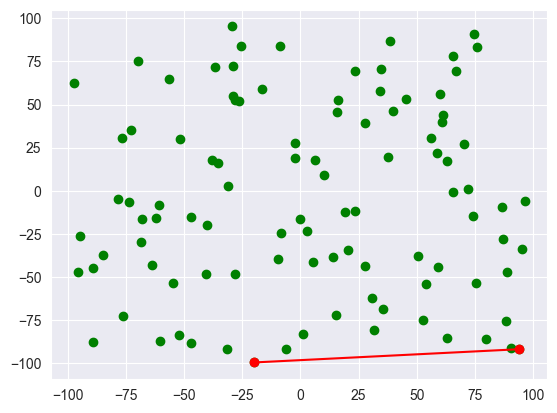

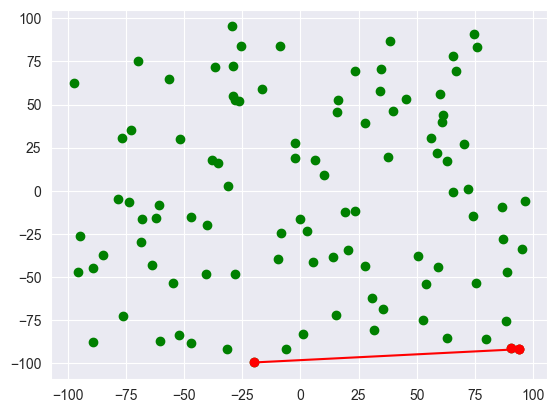

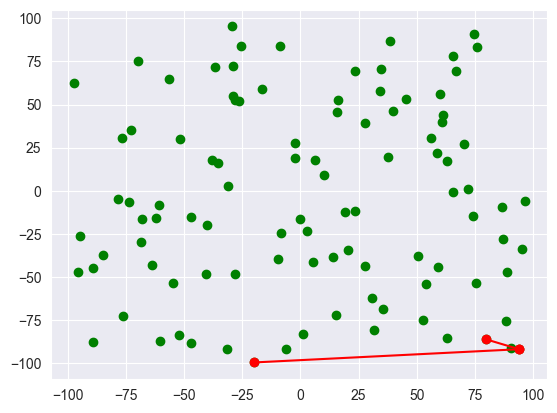

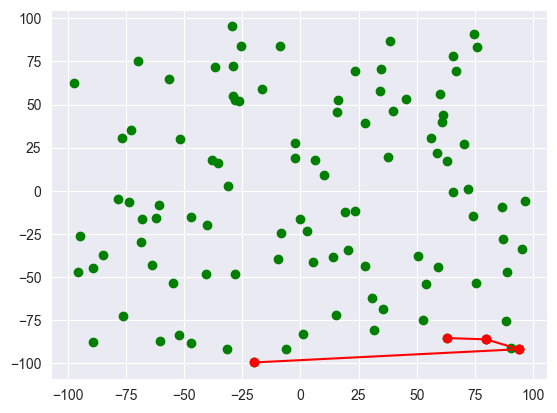

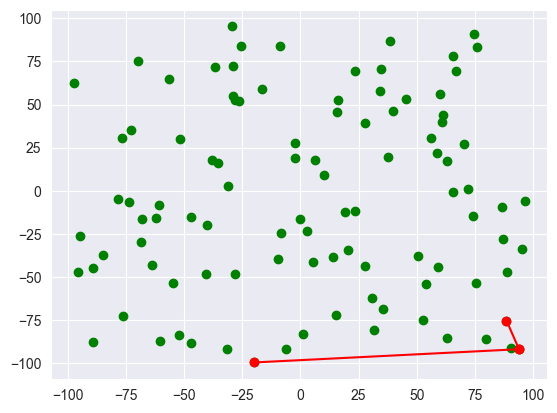

...

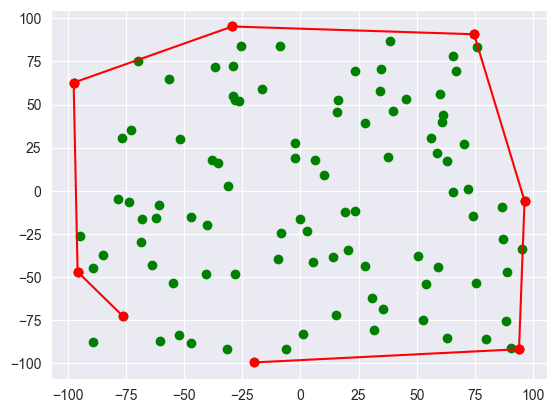

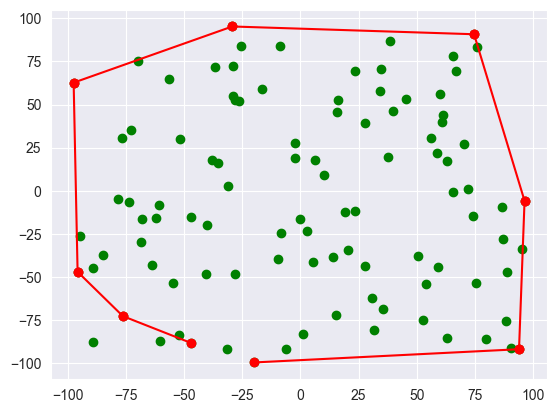

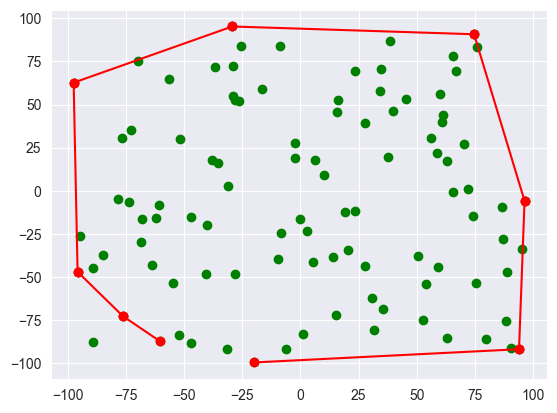

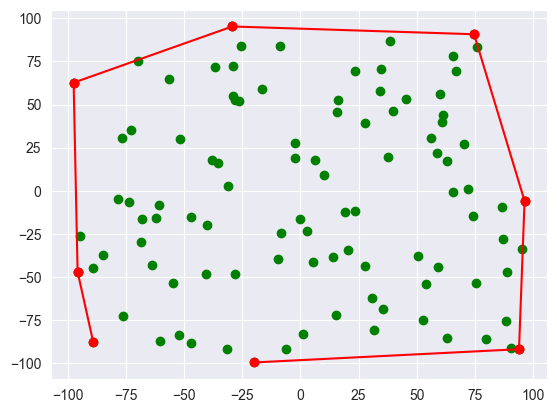

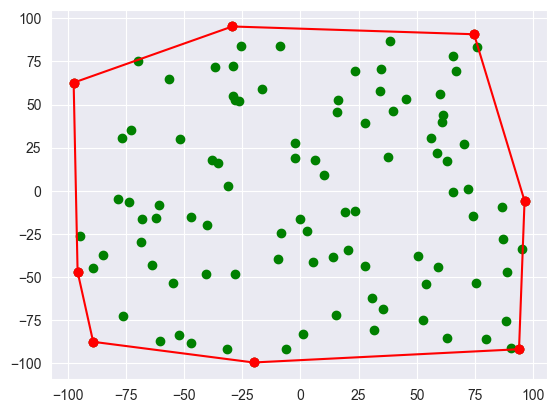

[(-20.18744015446437, -99.55960144581746),
 (94.07293295600138, -91.86911858709949),
 (96.44816079723168, -5.834408666226537),
 (74.71701475791201, 90.75053195826933),
 (-29.343051791041106, 95.25396340070819),
 (-97.6228516004549, 62.682569107902225),
 (-95.92155919268978, -46.99582843855372),
 (-89.2205006160052, -87.574799947918)]

In [33]:
graham(data_a)

#### 1 b)

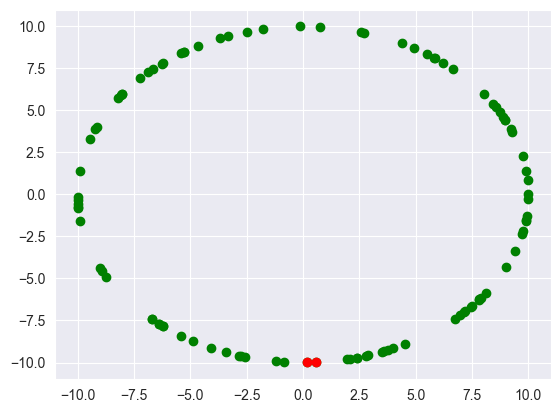

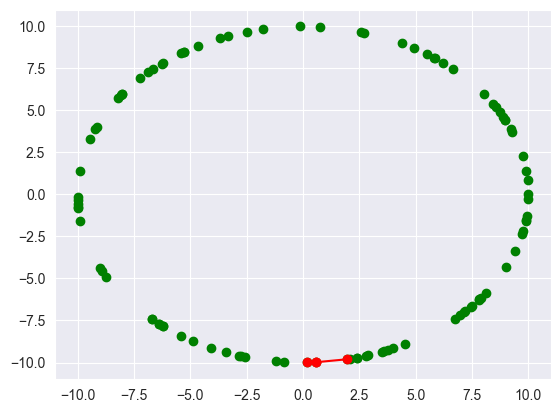

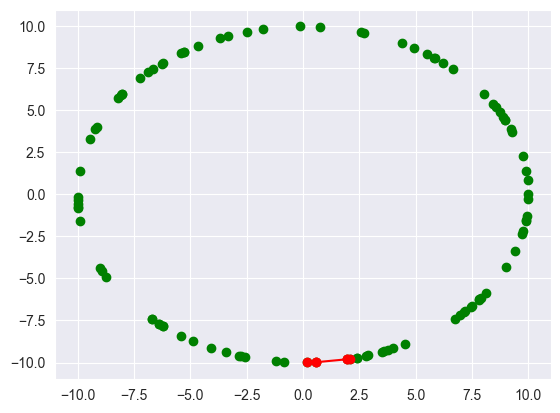

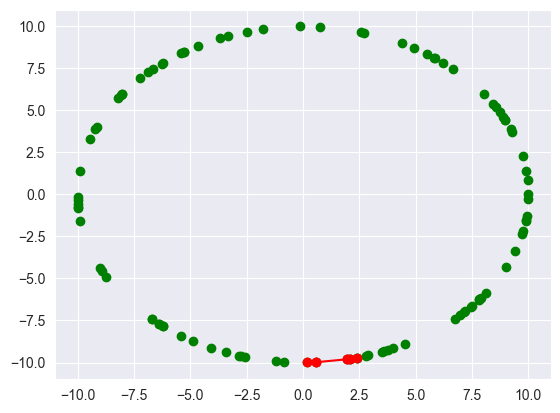

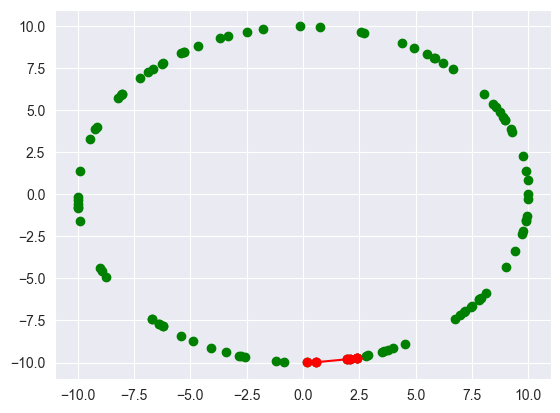

...

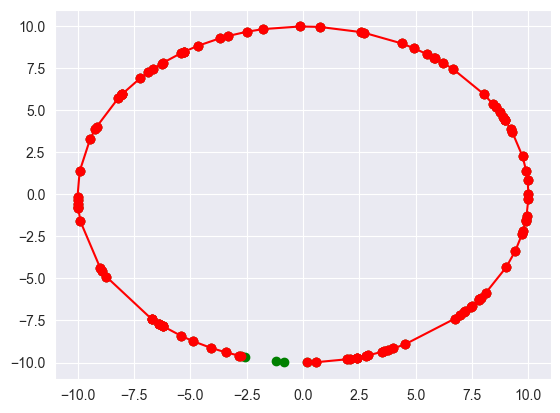

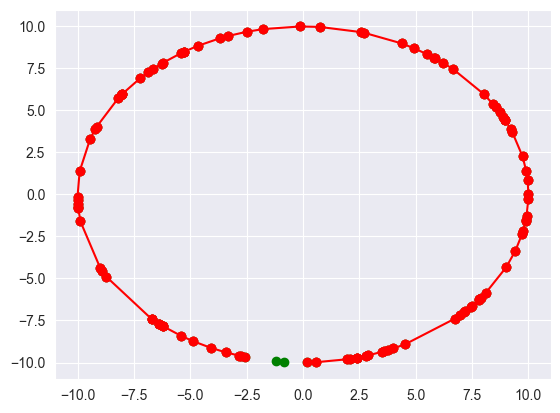

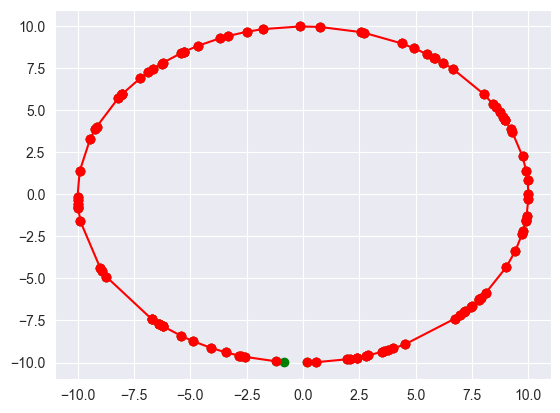

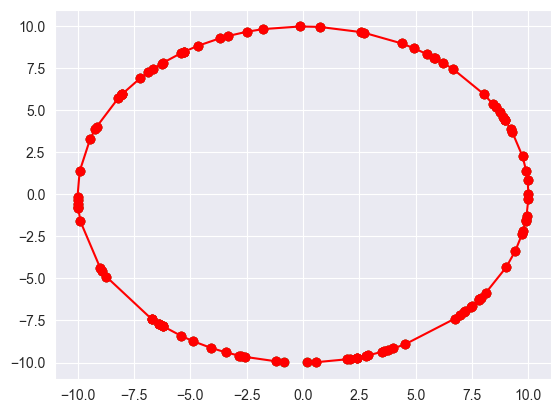

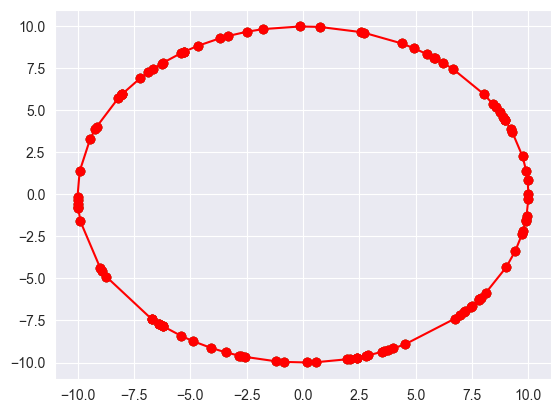

[(0.17450312994870049, -9.998477316953721),
 (0.5755274981286795, -9.983424667863115),
 (1.9518006268225312, -9.807674256067806),
 (2.0986457068442, -9.77730464888685),
 (2.388619168560671, -9.710535436709169),
 (2.4124274097736, -9.704648061242253),
 (2.780518752932098, -9.605660594909281),
 (2.9033257290366263, -9.569258054369417),
 (3.5054049922454666, -9.365475740203514),
 (3.581661350787017, -9.33657870787145),
 (3.78448012677572, -9.256225481806265),
 (4.001767547036353, -9.164379766219133),
 (4.534600084879003, -8.912766241196689),
 (6.741442090513835, -7.385997464137695),
 (6.961910069809839, -7.178565886016536),
 (7.161108846019725, -6.97986533505182),
 (7.207946732231612, -6.931486413844555),
 (7.439946917342466, -6.681855271339416),
 (7.478218133027708, -6.6389949205324434),
 (7.79145587354612, -6.268430056288708),
 (7.808483800001992, -6.247205835019882),
 (7.877784878116955, -6.159586464537358),
 (8.11721013827841, -5.8404537127718275),
 (9.010961138619312, -4.336194109849

In [34]:
graham(data_b)

#### 1 c)

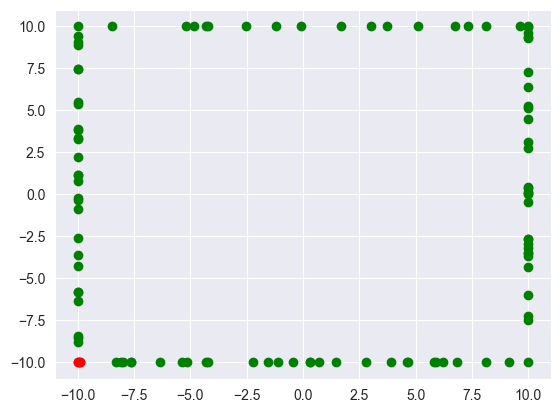

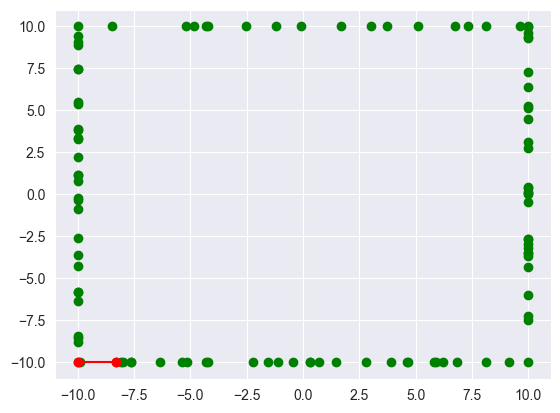

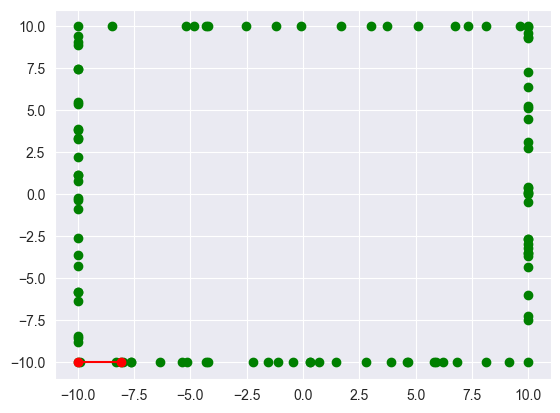

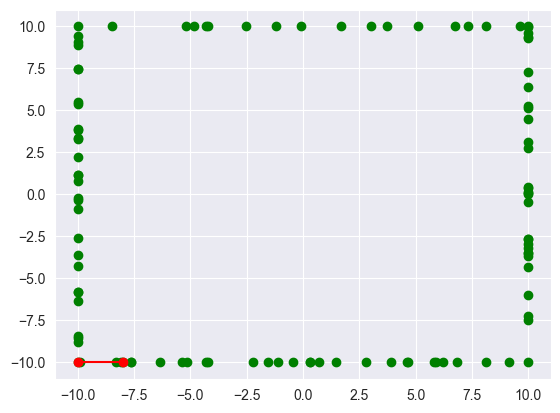

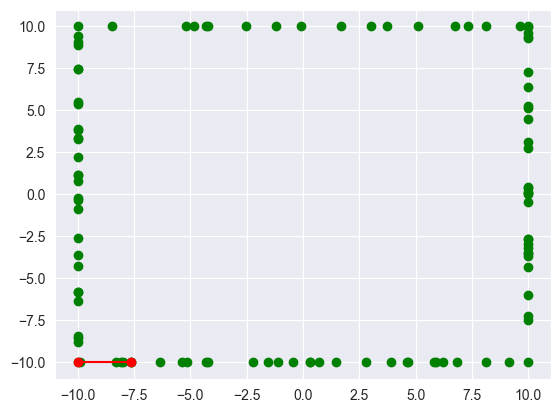

...

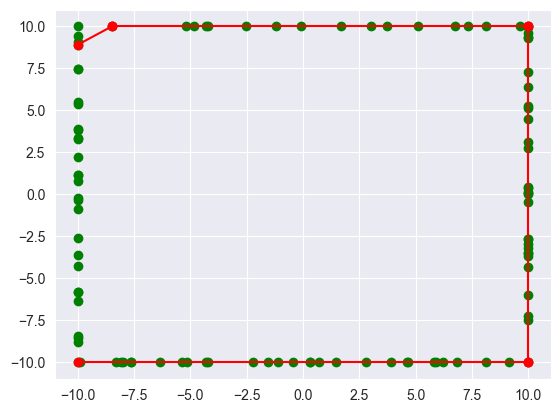

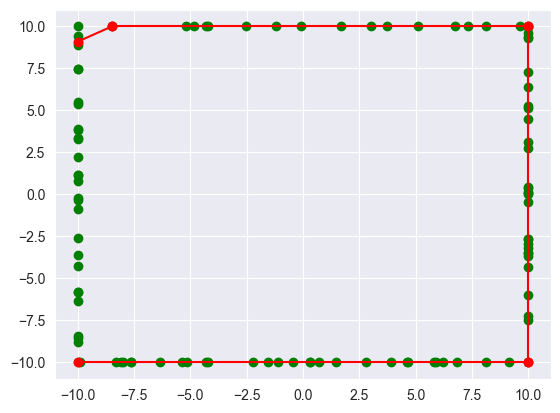

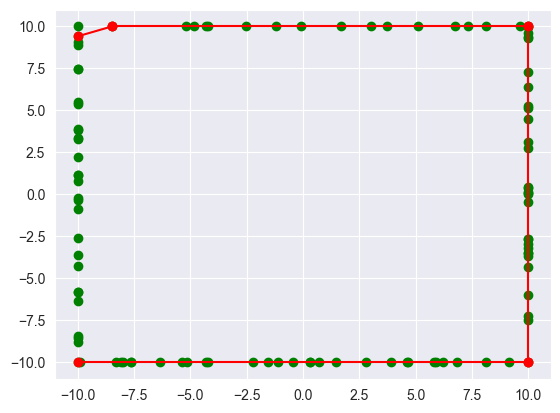

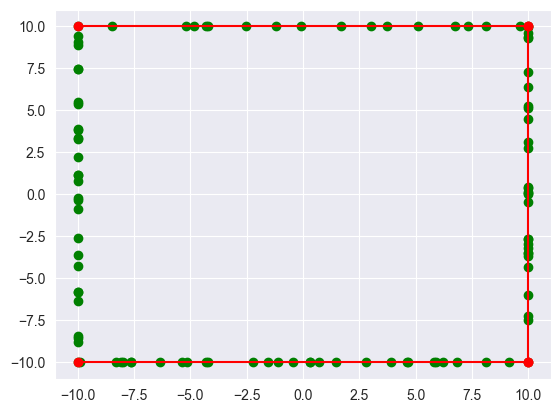

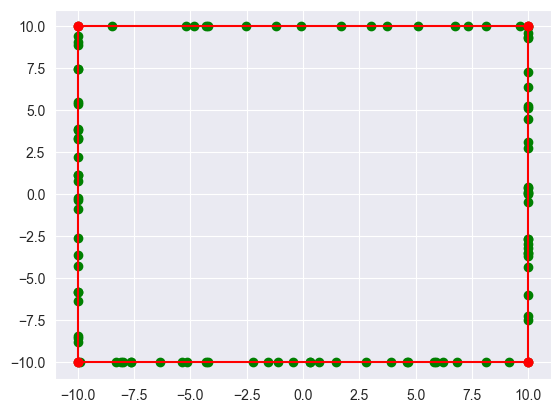

[(-10.0, -10.0), (10.0, -10.0), (10.0, 10.0), (-10.0, 10.0)]

In [35]:
graham(data_c)

#### 1 d)

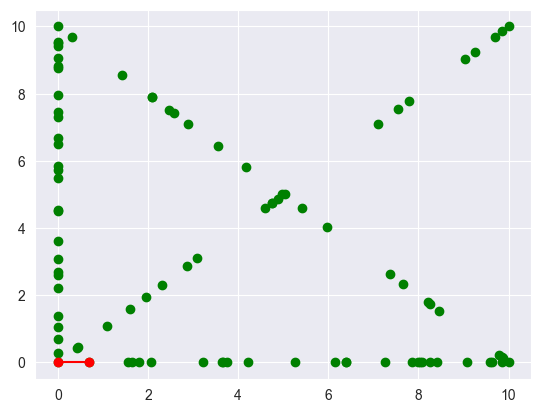

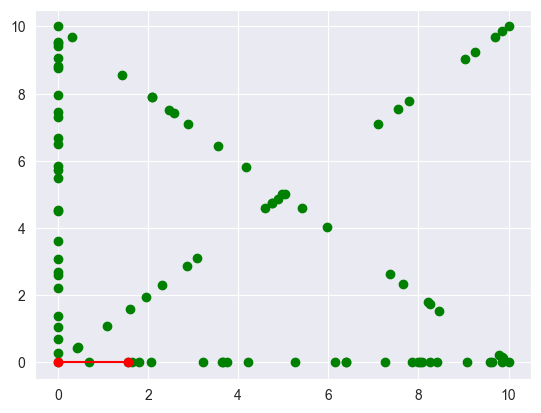

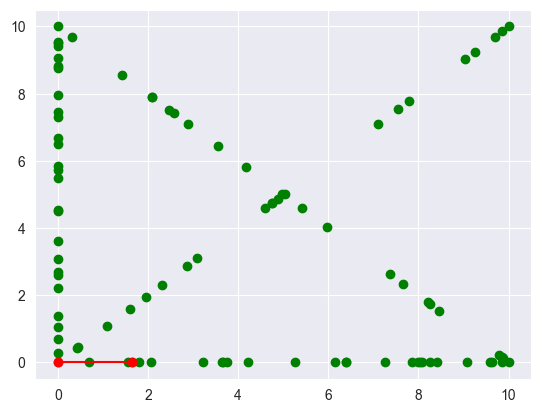

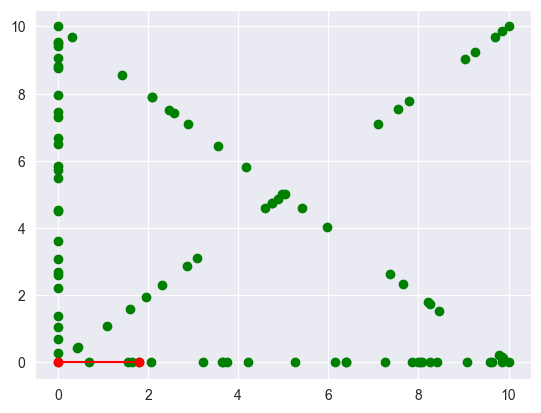

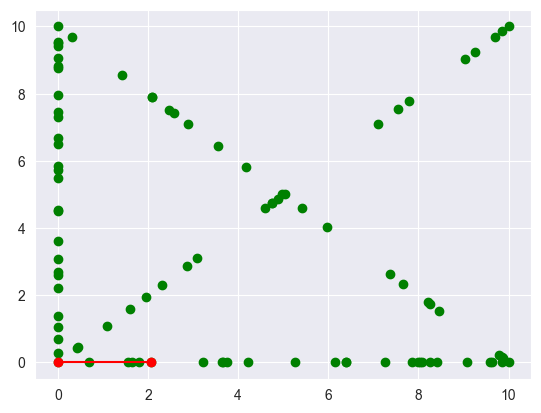

...

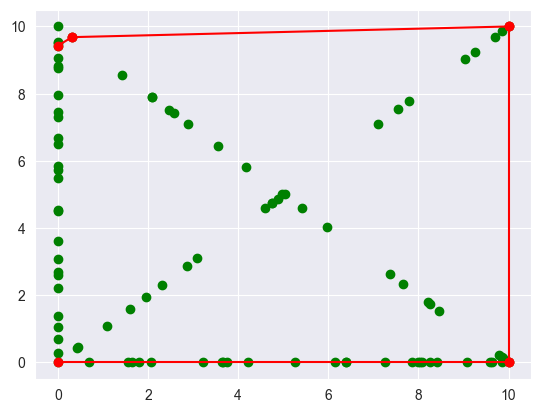

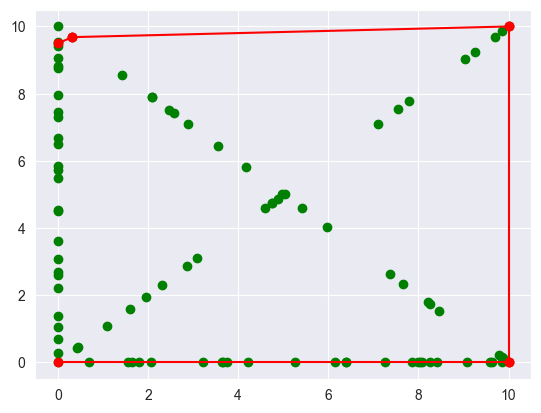

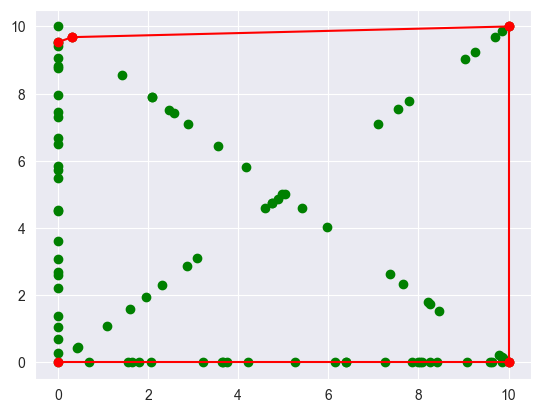

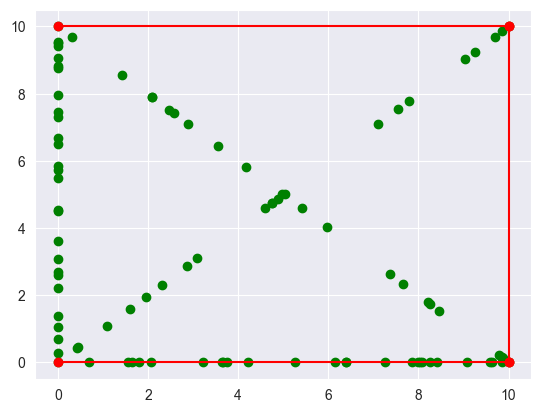

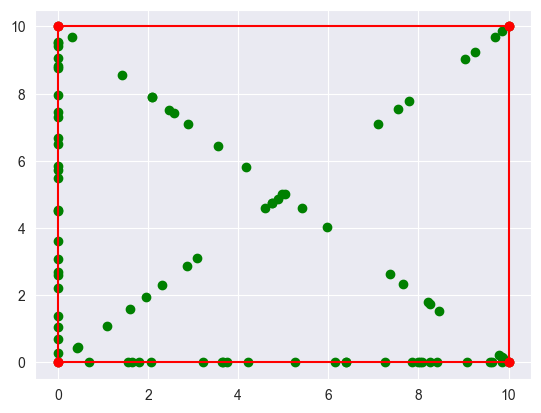

[(0.0, 0.0), (10.0, 0.0), (10.0, 10.0), (0.0, 10.0)]

In [36]:
graham(data_d)

## Jarvis

#### 3 a)

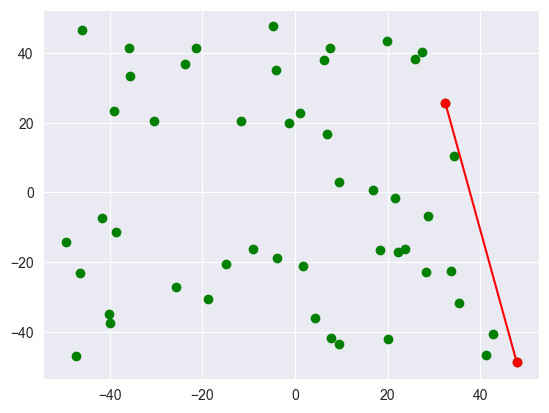

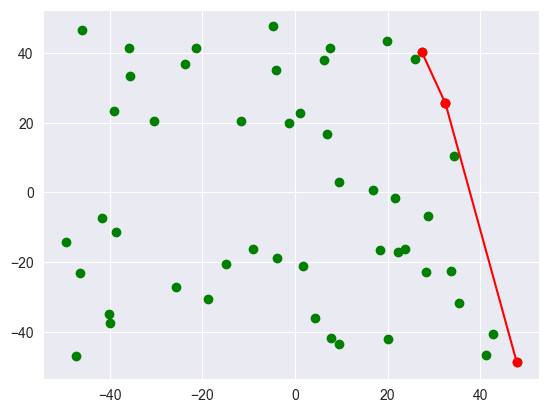

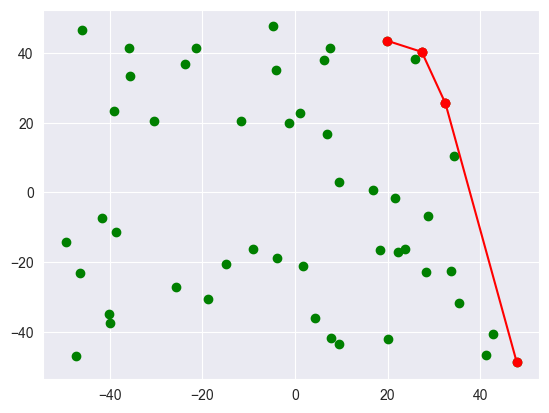

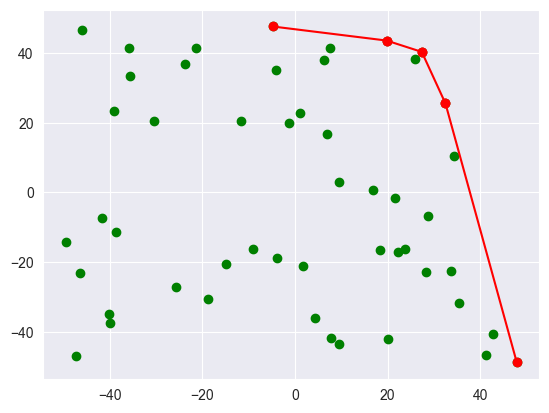

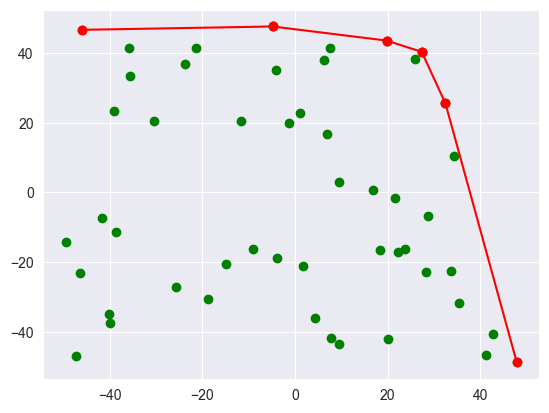

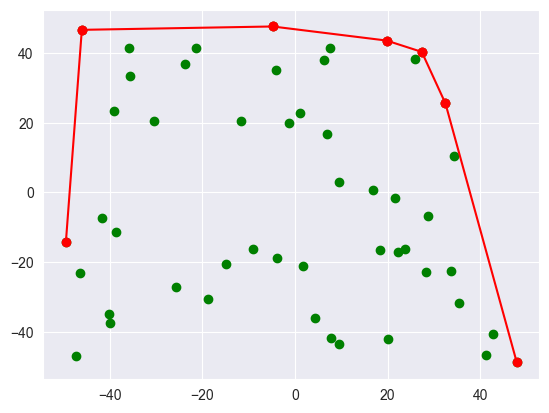

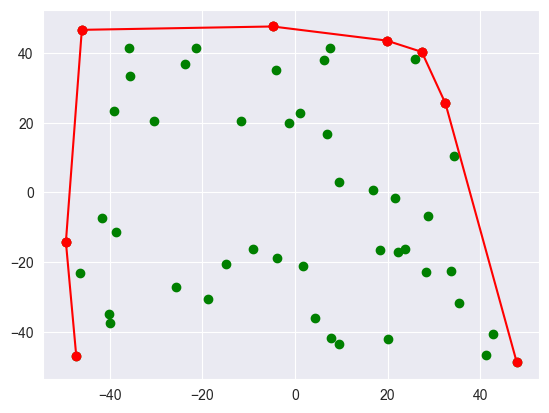

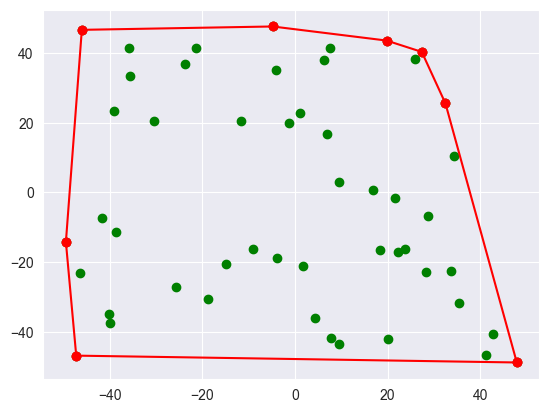

[(47.91982061770965, -48.706722246346565),
 (32.50382988912854, 25.517628803455196),
 (27.388896004639946, 40.286685458603586),
 (19.78273195969159, 43.53472747085769),
 (-4.836624861997471, 47.568683211879986),
 (-46.05738486170495, 46.60509162269865),
 (-49.50030351586147, -14.179288075654306),
 (-47.268143851623925, -46.745248411050625)]

In [143]:
jarvis(new_data_a)

#### 3 b)

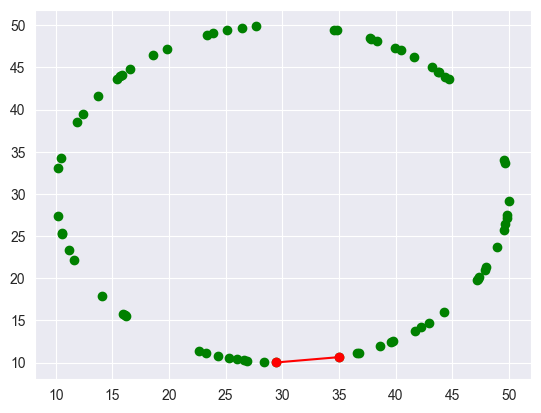

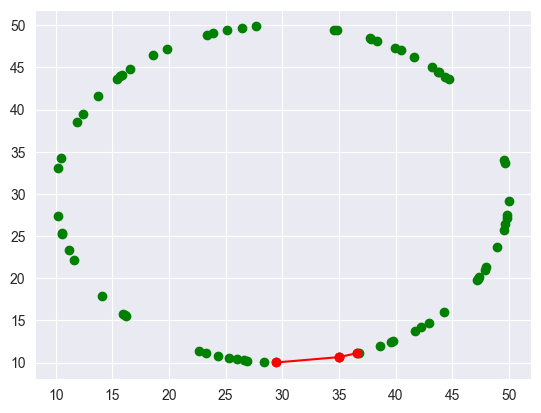

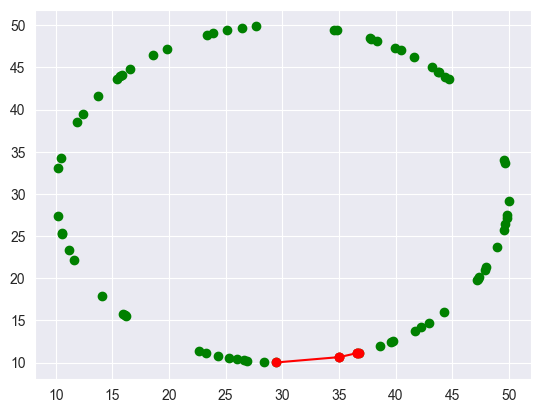

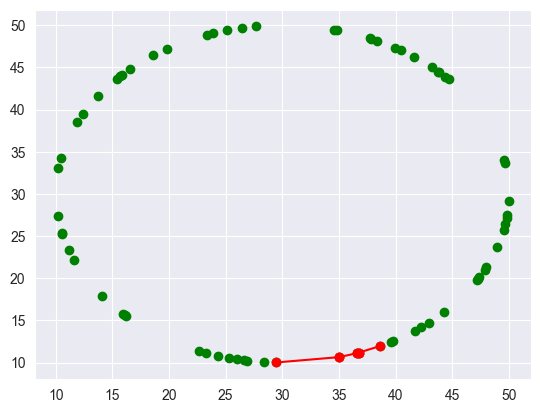

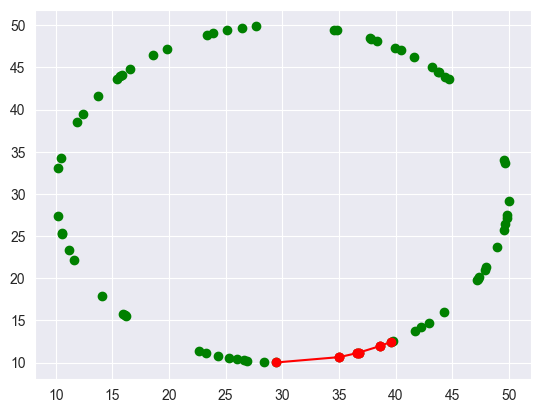

...

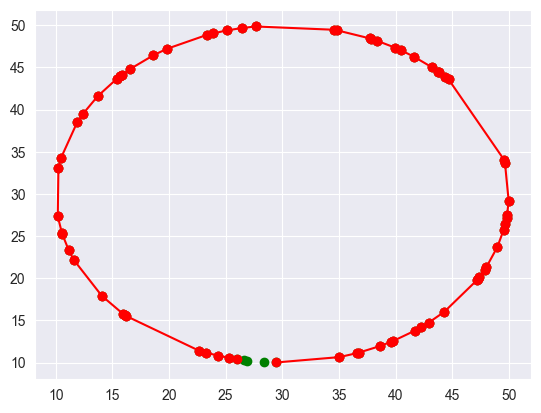

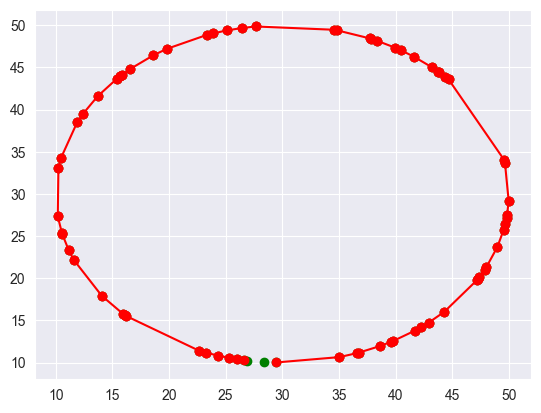

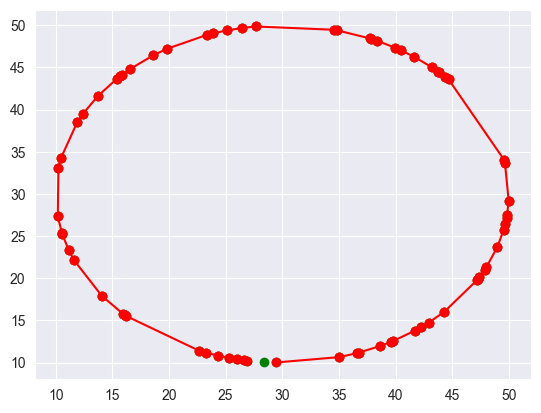

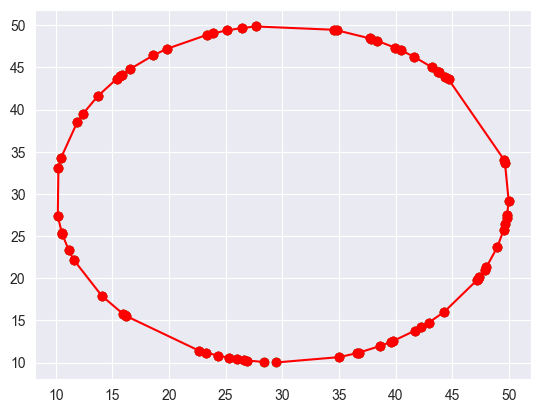

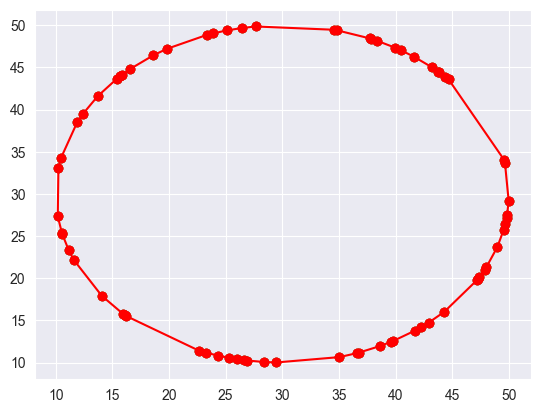

[(29.437345239272116, 10.007916076100763),
 (35.04256670173039, 10.646123875083834),
 (36.58546881584053, 11.115307773871667),
 (36.73490959065274, 11.168085790187614),
 (38.60395875737727, 11.945308263463733),
 (39.59001082096911, 12.449168325868563),
 (39.80641432078601, 12.569158420515574),
 (41.72016774857062, 13.79390028583789),
 (42.25903610348878, 14.197594049849286),
 (42.92830603696321, 14.740284962863143),
 (44.29631280348235, 16.01374102109551),
 (47.20274450371794, 19.798746080025147),
 (47.24801165381556, 19.875470678108407),
 (47.38169783595675, 20.106740661465686),
 (47.874029532349454, 21.026758206941054),
 (48.00427909653625, 21.291042874486763),
 (48.980834050359675, 23.696989707075947),
 (49.54053310317798, 25.737657211860423),
 (49.67816278042713, 26.426498973413835),
 (49.79155667771516, 27.120020091599855),
 (49.83759312646257, 27.45640039532066),
 (49.98285249073486, 29.17198651367763),
 (49.65123093542917, 33.71875284503172),
 (49.5917251655541, 34.0204856718304

In [144]:
jarvis(new_data_b)

#### 3 c)

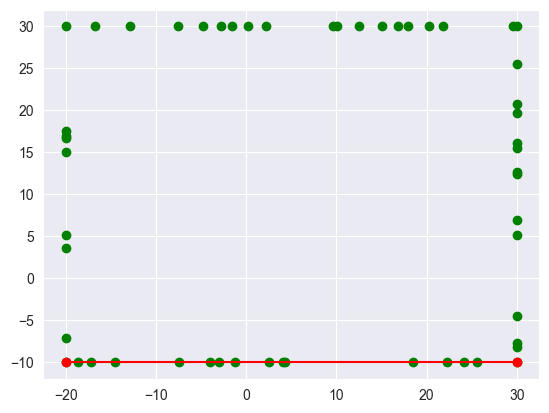

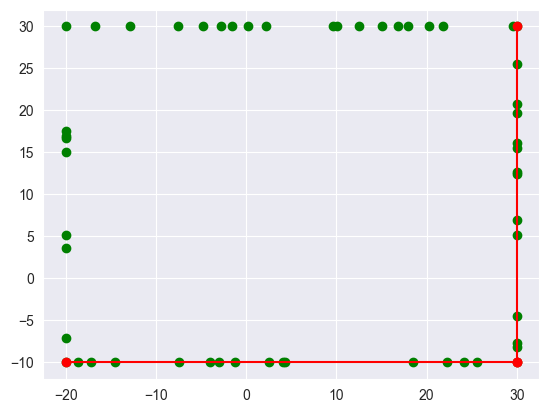

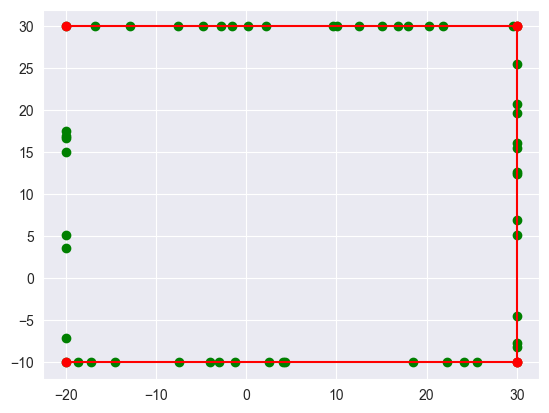

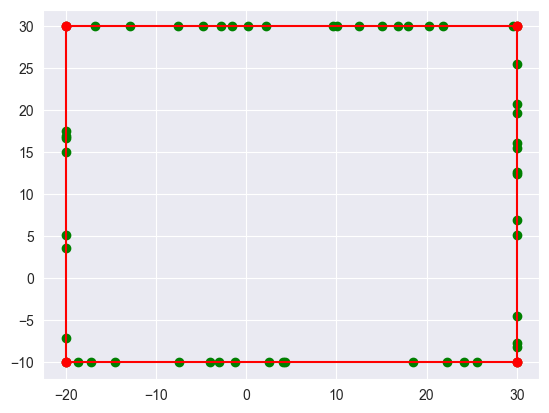

[(-20.0, -10.0), (30.0, -10.0), (30.0, 30.0), (-20.0, 30.0)]

In [39]:
jarvis(new_data_c)

#### 3 d)

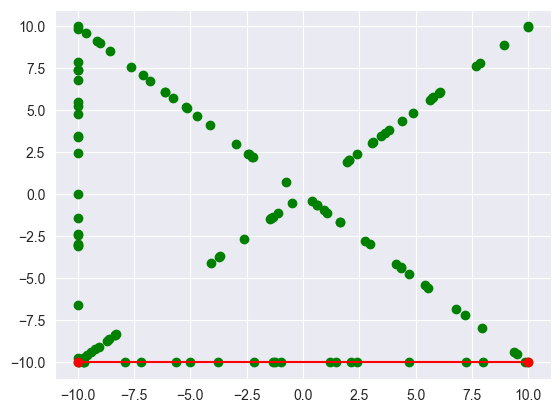

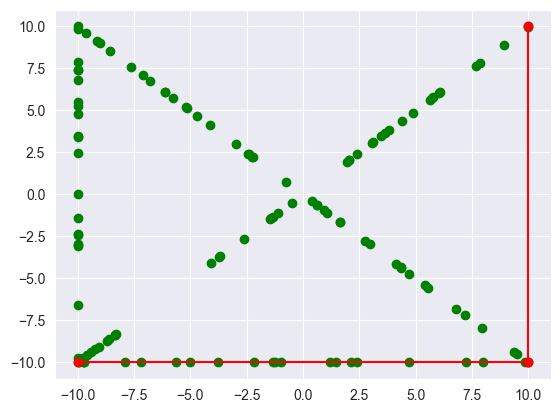

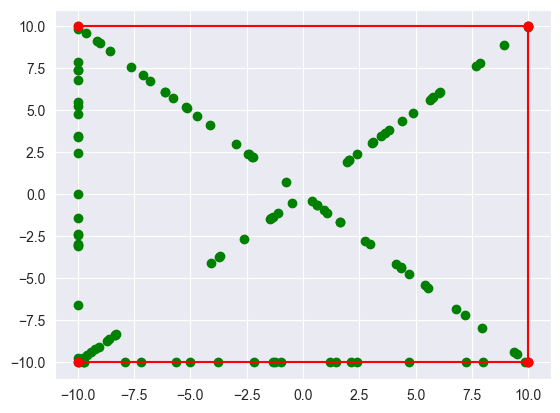

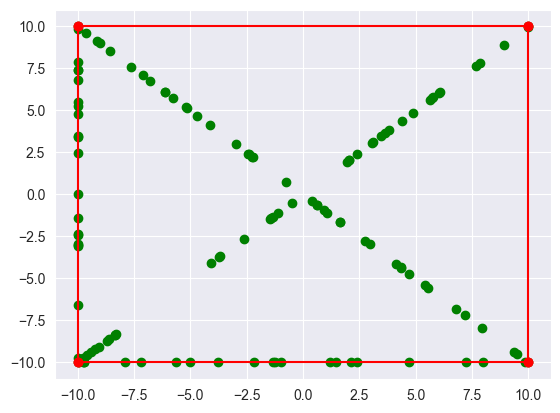

[(-10.0, -10.0), (10.0, -10.0), (10.0, 10.0), (-10.0, 10.0)]

In [40]:
jarvis(new_data_d)

## Porównanie czasów

In [275]:
columns = ["Punkty", "Zakres a", "Zakres b", "Czas grahama", "Czas jarvisa","Szybszy", "Porównanie czasów"]   
data = []
for i in range(1, 10):
    ranges = [-200, 200]
    count = i * np.random.randint(i*100, i*200)
    new_table = generate_random_points(count, ranges)
    new_data = pd.DataFrame(data=new_table, columns=['X', 'Y'])
    graham_time = timeit.timeit(lambda:graham(new_data,visualize = False),number=1)
    jarvis_time = timeit.timeit(lambda:convexHull(new_table, len(new_table),visualize = False),number=1)
    winner = None
    if (graham_time > jarvis_time):
        winner = "jarvis"
    else:
        winner = "graham"
    comp = abs(graham_time-jarvis_time)
    data.append([count,ranges[0],ranges[1],graham_time,jarvis_time,winner,comp])
time_data_a =  pd.DataFrame(data=data, columns=columns)

In [276]:
time_data_a

,Punkty,Zakres a,Zakres b,Czas grahama,Czas jarvisa,Szybszy,Porównanie czasów
0,104,-200,200,0.011974,0.002269,jarvis,0.009705
1,610,-200,200,0.034674,0.014170,jarvis,0.020504
2,1431,-200,200,0.048551,0.018539,jarvis,0.030012
3,2612,-200,200,0.083732,0.046291,jarvis,0.037441
4,2975,-200,200,0.095439,0.063684,jarvis,0.031755
5,6690,-200,200,0.222559,0.121889,jarvis,0.100669
6,8106,-200,200,0.262622,0.169580,jarvis,0.093042
7,11432,-200,200,0.373896,0.247948,jarvis,0.125948
8,11097,-200,200,0.362113,0.256284,jarvis,0.105829


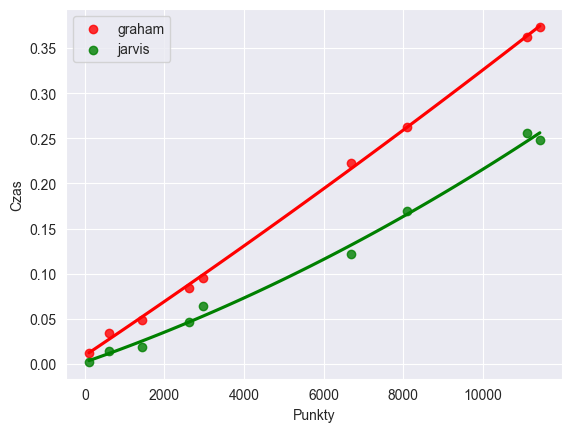

In [300]:
ax = sns.regplot(data=time_data_a, x="Punkty", y="Czas grahama",label='graham',color = "red",ci=None,order=2)
ax = sns.regplot(data=time_data_a, x="Punkty", y="Czas jarvisa", label='jarvis',color = "green",ci=None,order=2)
ax.set(xlabel = "Punkty",ylabel = "Czas")
plt.legend(loc="best")

In [278]:
columns = ["Punkty", "Środek", "R", "Czas grahama", "Czas jarvisa","Szybszy", "Porównanie czasów"]   
data = []
for i in range(1, 10):
    center = [np.random.randint(-10, 10),np.random.randint(-10, 10)]
    R = np.random.randint(1,10)
    count = np.random.randint(i*70, i*90)
    new_table = generate_random_circle(count,center,R)
    new_data = pd.DataFrame(data=new_table, columns=['X', 'Y'])
    graham_time = timeit.timeit(lambda:graham(new_data,visualize = False),number=1)
    jarvis_time = timeit.timeit(lambda:convexHull(new_table, len(new_table),visualize = False),number=1)
    winner = None
    if (graham_time > jarvis_time):
        winner = "jarvis"
    else:
        winner = "graham"
    comp = abs(graham_time-jarvis_time)
    data.append([count,center,R,graham_time,jarvis_time,winner,comp])
time_data_b = pd.DataFrame(data=data, columns=columns)

In [279]:
time_data_b

,Punkty,Środek,R,Czas grahama,Czas jarvisa,Szybszy,Porównanie czasów
0,83,"[-3, -7]",2,0.011840,0.006505,jarvis,0.005336
1,179,"[3, -5]",7,0.010527,0.025232,graham,0.014706
2,252,"[-4, -6]",7,0.010822,0.027441,graham,0.016618
3,348,"[-10, 0]",3,0.010713,0.047208,graham,0.036495
4,434,"[4, 2]",8,0.013230,0.076075,graham,0.062845
5,441,"[-2, -4]",4,0.013373,0.077479,graham,0.064105
6,512,"[-6, -8]",8,0.016318,0.103751,graham,0.087433
7,675,"[9, 4]",3,0.020974,0.179466,graham,0.158492
8,732,"[3, 0]",2,0.022626,0.211364,graham,0.188738


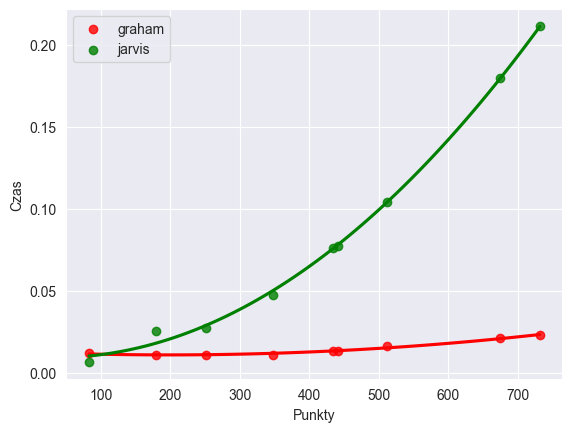

In [301]:
ax = sns.regplot(data=time_data_b, x="Punkty", y="Czas grahama",label='graham',color = "red",ci=None,order=2)
ax = sns.regplot(data=time_data_b, x="Punkty", y="Czas jarvisa", label='jarvis',color = "green",ci=None,order=2)
ax.set(xlabel = "Punkty",ylabel = "Czas")
plt.legend(loc="best")

In [281]:
columns = ["Punkty", "Rogi", "Czas grahama", "Czas jarvisa","Szybszy", "Porównanie czasów"]   
data = []
for i in range(1, 10):
    x1 = np.random.randint(-30, 30)
    x2 = np.random.randint(-30, 30)
    y1 = np.random.randint(-30, 30)
    y2 = np.random.randint(-30, 30)
    vertices = [(x1,y1),(x1,y2),(x2,y1),(x2,y2)]
    center = [np.random.randint(-10, 10),np.random.randint(-10, 10)]
    count = i * np.random.randint(i*100, i*200)
    new_table = generate_random_rectangle(count,vertices)
    new_data = pd.DataFrame(data=new_table, columns=['X', 'Y'])
    graham_time = timeit.timeit(lambda:graham(new_data,visualize = False),number=1)
    jarvis_time = timeit.timeit(lambda:convexHull(new_table, len(new_table),visualize = False),number=1)
    winner = None
    if (graham_time > jarvis_time):
        winner = "jarvis"
    else:
        winner = "graham"
    comp = abs(graham_time-jarvis_time)
    data.append([count+4,vertices,graham_time,jarvis_time,winner,comp])
time_data_c = pd.DataFrame(data=data, columns=columns)

In [282]:
time_data_c

,Punkty,Rogi,Czas grahama,Czas jarvisa,Szybszy,Porównanie czasów
0,142,"[(-10, 23), (-10, 17), (-4, 23), (-4, 17)]",0.005110,0.000728,jarvis,0.004382
1,556,"[(10, 29), (10, 17), (-20, 29), (-20, 17)]",0.021401,0.001770,jarvis,0.019631
2,1048,"[(-17, -19), (-17, 7), (-6, -19), (-6, 7)]",0.040446,0.003296,jarvis,0.037151
3,2756,"[(-1, 5), (-1, -1), (-11, 5), (-11, -1)]",0.109240,0.008852,jarvis,0.100389
4,3094,"[(-16, -14), (-16, 3), (-13, -14), (-13, 3)]",0.114177,0.008984,jarvis,0.105193
5,4498,"[(16, 17), (16, 25), (26, 17), (26, 25)]",0.169731,0.013204,jarvis,0.156527
6,7641,"[(-8, 0), (-8, 12), (-5, 0), (-5, 12)]",0.290467,0.022123,jarvis,0.268344
7,12708,"[(21, 29), (21, 18), (-8, 29), (-8, 18)]",0.497220,0.037111,jarvis,0.460109
8,10039,"[(28, -26), (28, -7), (8, -26), (8, -7)]",0.388465,0.031133,jarvis,0.357332


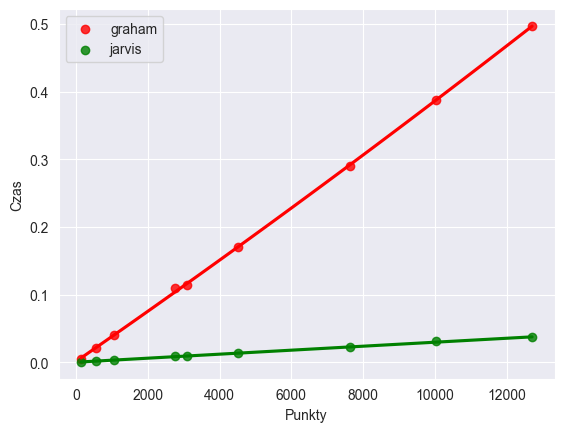

In [302]:
ax = sns.regplot(data=time_data_c, x="Punkty", y="Czas grahama",label='graham',color = "red",ci=None,order=2)
ax = sns.regplot(data=time_data_c, x="Punkty", y="Czas jarvisa", label='jarvis',color = "green",ci=None,order=2)
ax.set(xlabel = "Punkty",ylabel = "Czas")
plt.legend(loc="best")

In [310]:
columns = ["Razem","Boki","Przekątne", "Rogi", "Czas grahama", "Czas jarvisa","Szybszy", "Porównanie czasów"]   
data = []
for i in range(1, 10):
    x1 = np.random.randint(-30, 30)
    x2 = np.random.randint(-30, 30)
    side = abs(x2 - x1)
    y = np.random.randint(-30, 30)
    vertices = [(x1, y), (x2, y), (x1, y + side), (x2, y + side)]
    count_a = i* np.random.randint(i*400, i*600)
    count_b = i* np.random.randint(i*400, i*600)
    
    new_table = generate_random_square(vertices,0,count_b)
    new_data = pd.DataFrame(data=new_table, columns=['X', 'Y'])
    graham_time = timeit.timeit(lambda:graham(new_data,visualize = False),number=1)
    jarvis_time = timeit.timeit(lambda:convexHull(new_table, len(new_table),visualize = False),number=1)
    winner = None
    if (graham_time > jarvis_time):
        winner = "jarvis"
    else:
        winner = "graham"
    comp = abs(graham_time-jarvis_time)
    data.append([count_a+count_b+4,count_a,count_b,vertices,graham_time,jarvis_time,winner,comp])
time_data_d = pd.DataFrame(data=data, columns=columns)

In [311]:
time_data_d

,Razem,Boki,Przekątne,Rogi,Czas grahama,Czas jarvisa,Szybszy,Porównanie czasów
0,1073,537,532,"[(-2, 11), (16, 11), (-2, 29), (16, 29)]",0.058847,0.001668,jarvis,0.057180
1,3500,1738,1758,"[(-11, 28), (-26, 28), (-11, 43), (-26, 43)]",0.122993,0.004421,jarvis,0.118572
2,8533,3828,4701,"[(-10, 22), (-5, 22), (-10, 27), (-5, 27)]",0.347784,0.011609,jarvis,0.336175
3,15904,8704,7196,"[(22, -2), (-28, -2), (22, 48), (-28, 48)]",0.513934,0.017862,jarvis,0.496072
4,26464,12935,13525,"[(28, -15), (4, -15), (28, 9), (4, 9)]",1.017350,0.033829,jarvis,0.983521
5,36064,20616,15444,"[(2, -15), (25, -15), (2, 8), (25, 8)]",1.229639,0.042451,jarvis,1.187189
6,53498,28287,25207,"[(4, 26), (19, 26), (4, 41), (19, 41)]",1.845279,0.063304,jarvis,1.781975
7,73892,37088,36800,"[(14, -6), (-22, -6), (14, 30), (-22, 30)]",2.753435,0.113354,jarvis,2.640081
8,84802,36774,48024,"[(-3, -27), (3, -27), (-3, -21), (3, -21)]",3.665733,0.119825,jarvis,3.545908


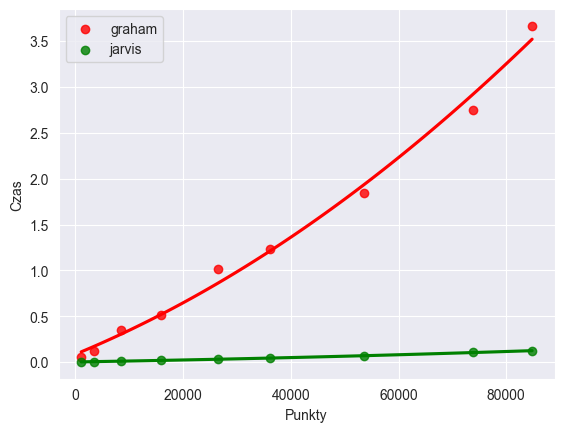

In [312]:
ax = sns.regplot(data=time_data_d, x="Razem", y="Czas grahama",label='graham',color = "red",ci=None,order=2)
ax = sns.regplot(data=time_data_d, x="Razem", y="Czas jarvisa", label='jarvis',color = "green",ci=None,order=2)
ax.set(xlabel = "Punkty",ylabel = "Czas")
plt.legend(loc="best")